In [13]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs

# Parameters
n_samples = 300
centers = 2
cluster_std = 1.0
random_state = 42

# Generate blobs
X_blobs, y_blobs = make_blobs(n_samples=n_samples, centers=centers, cluster_std=cluster_std, random_state=random_state)


In [14]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

# Define the parameter grid
C_values = [0.1, 1, 10]
gamma_values = [0.1, 1, 10]
kernels = ['linear', 'rbf','poly','sigmoid']



In [15]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


def plot_training_data_with_decision_boundary(
    X, y, kernel, gamma, C=1, ax=None, support_vectors=True
):

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
    # Train the SVC
    clf = SVC(kernel=kernel, gamma=gamma,C=C).fit(X_train, y_train)

    #evaluating the model
    y_pred = clf.predict(X_test)
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)

    # Settings for plotting
    if ax is None:
        _, ax = plt.subplots(figsize=(4, 3))
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Plot decision boundary and margins
    common_params = {"estimator": clf, "X": X, "ax": ax}
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="predict",
        plot_method="pcolormesh",
        alpha=0.3,
    )
    DecisionBoundaryDisplay.from_estimator(
        **common_params,
        response_method="decision_function",
        plot_method="contour",
        levels=[-1, 0, 1],
        colors=["k", "k", "k"],
        linestyles=["--", "-", "--"],
    )

    if support_vectors:
        # Plot bigger circles around samples that serve as support vectors
        ax.scatter(
            clf.support_vectors_[:, 0],
            clf.support_vectors_[:, 1],
            s=150,
            facecolors="none",
            edgecolors="k",
        )

    # Plot samples by color and add legend
    scatter=ax.scatter(X[:, 0], X[:, 1], c=y, s=30, edgecolors="k")
    ax.legend(*scatter.legend_elements(), loc="upper right", title="Classes")
    ax.set_title(f"'{kernel}',C={C},gamma={gamma},acc={accuracy:.2f}")


    if ax is None:
        plt.show()





In [16]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs

# Parameters
n_samples = 500
centers = 2
cluster_std = 1.0
random_state = 42

# Generate blobs
X_blobs, y_blobs = make_blobs(n_samples=n_samples, centers=centers, cluster_std=cluster_std, random_state=random_state)


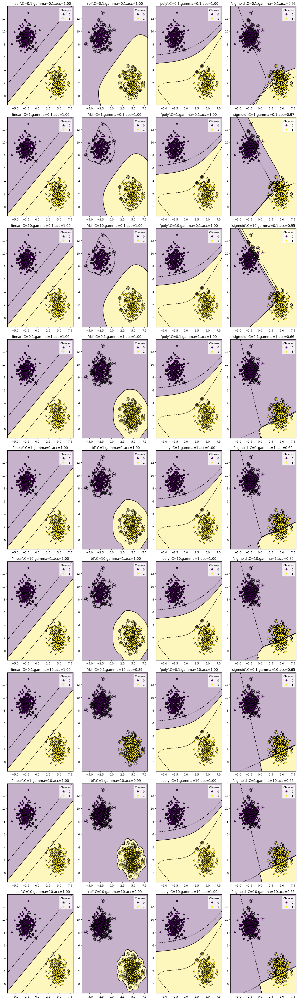

In [17]:
_, axes = plt.subplots(len(C_values) * len(gamma_values), len(kernels), figsize=(15, 50))
axes = axes.flatten()


index = 0
for C in C_values:
    for gamma in gamma_values:
        for kernel in kernels:
              plot_training_data_with_decision_boundary(X_blobs,y_blobs,kernel, C, gamma,axes[index])
              index+=1
# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [23]:
from sklearn.datasets import make_moons
# Generate moons
X_moons, y_moons = make_moons(n_samples=n_samples, noise=0.1, random_state=random_state)

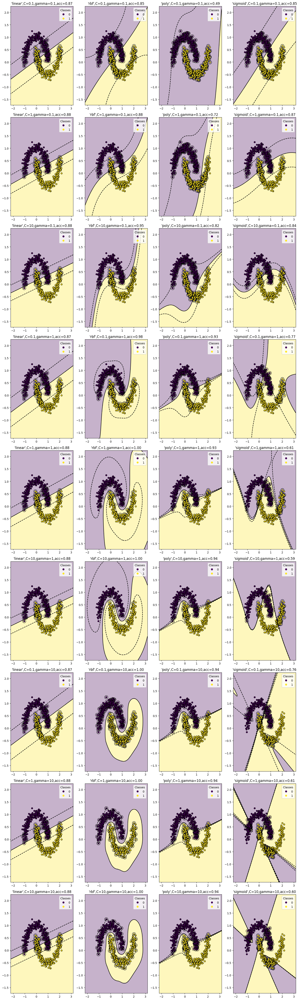

In [24]:
_, axes = plt.subplots(len(C_values) * len(gamma_values), len(kernels), figsize=(15, 50))
axes = axes.flatten()


index = 0
for C in C_values:
    for gamma in gamma_values:
        for kernel in kernels:
              plot_training_data_with_decision_boundary(X_moons,y_moons,kernel, C, gamma,axes[index])
              index+=1
# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [25]:
from sklearn.datasets import make_circles
# Generate circles
X_circles, y_circles = make_circles(n_samples=1000, noise=0.05, factor=0.5, random_state=42)

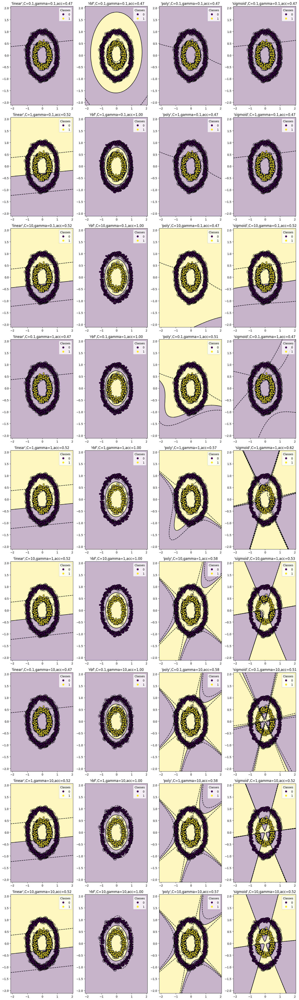

In [29]:
_, axes = plt.subplots(len(C_values) * len(gamma_values), len(kernels), figsize=(15, 50))
axes = axes.flatten()


index = 0
for C in C_values:
    for gamma in gamma_values:
        for kernel in kernels:
              plot_training_data_with_decision_boundary(X_circles,y_circles,kernel, C, gamma,axes[index])
              index+=1
# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [31]:
# Generate random data
np.random.seed(0)
X_and = np.random.randn(100, 2)
y_and= np.logical_and(X_and[:, 0] > 0, X_and[:, 1] > 0)



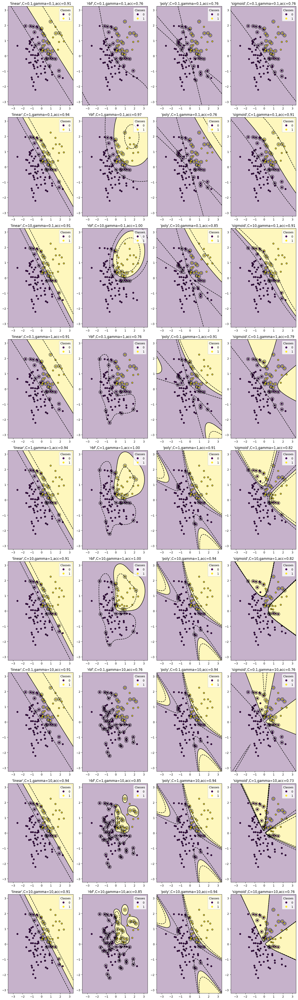

In [35]:
_, axes = plt.subplots(len(C_values) * len(gamma_values), len(kernels), figsize=(15, 50))
axes = axes.flatten()


index = 0
for C in C_values:
    for gamma in gamma_values:
        for kernel in kernels:
              plot_training_data_with_decision_boundary(X_and,y_and,kernel, C, gamma,axes[index])
              index+=1
# Adjust spacing between subplots
plt.tight_layout()
plt.show()

In [36]:
# Generate random data
np.random.seed(0)
X_xor = np.random.randn(100, 2)
y_xor = np.logical_xor(X_xor[:, 0] > 0, X_xor[:, 1] > 0)



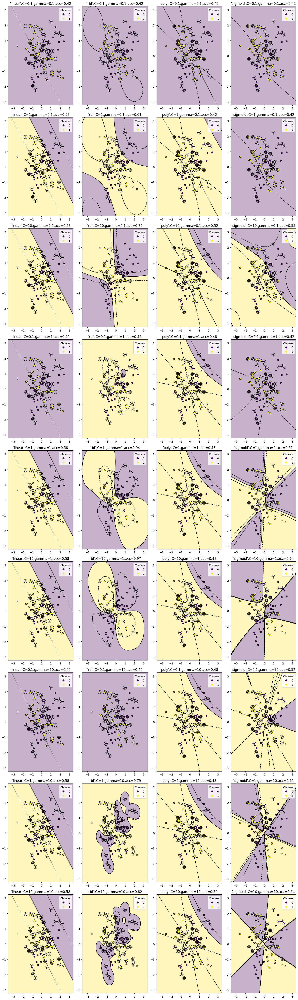

In [37]:
_, axes = plt.subplots(len(C_values) * len(gamma_values), len(kernels), figsize=(15, 50))
axes = axes.flatten()


index = 0
for C in C_values:
    for gamma in gamma_values:
        for kernel in kernels:
              plot_training_data_with_decision_boundary(X_xor,y_xor,kernel, C, gamma,axes[index])
              index+=1
# Adjust spacing between subplots
plt.tight_layout()
plt.show()